# Dunham Image Classifier using Vision Transformer

## Import Package

In [1]:
# Write any package/module installation that you need here
!pip install -q transformers datasets evaluate huggingface_hub accelerate

import os
import re
import random
import torch
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import datasets
from torchvision.transforms import RandomResizedCrop, Compose, Normalize, ToTensor
from torchvision.io import read_image
import matplotlib.pyplot as plt
from PIL import Image as PillowImage # Alias PIL.Image to PillowImage
import pandas as pd
from transformers import AutoImageProcessor, AutoModelForImageClassification, TrainingArguments, Trainer, DefaultDataCollator, pipeline
from datasets import load_dataset, Features, ClassLabel, Image # Import Image from datasets
import evaluate
import numpy as np
from huggingface_hub import notebook_login
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tqdm.auto import tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 3.4 MB/s eta 0:00:00


## Task-1 Load the dataset

In [10]:
# unzip dataset
# paper: https://onlinelibrary.wiley.com/doi/10.1111/sed.12293
# data: https://onlinelibrary.wiley.com/action/downloadSupplement?doi=10.1111%2Fsed.12293&file=sed12293-sup-0001-SupInfo.zip
# !wget "https://onlinelibrary.wiley.com/action/downloadSupplement?doi=10.1111%2Fsed.12293&file=sed12293-sup-0001-SupInfo.zip"
!unzip "/sed12293-sup-0001-supinfo.zip" -d "/content"

Archive:  /sed12293-sup-0001-supinfo.zip
   creating: /content/Supplemental material 1 - Thin section photomicrographs/
   creating: /content/Supplemental material 1 - Thin section photomicrographs/Sample 1/
  inflating: /content/Supplemental material 1 - Thin section photomicrographs/Sample 1/1 x10 PPL.jpg  
  inflating: /content/Supplemental material 1 - Thin section photomicrographs/Sample 1/1 x10 XPL.jpg  
  inflating: /content/Supplemental material 1 - Thin section photomicrographs/Sample 1/1 x2 PPL.jpg  
  inflating: /content/Supplemental material 1 - Thin section photomicrographs/Sample 1/1 x2 XPL.jpg  
  inflating: /content/Supplemental material 1 - Thin section photomicrographs/Sample 1/1 x4 PPL.jpg  
  inflating: /content/Supplemental material 1 - Thin section photomicrographs/Sample 1/1 x4 XPL.jpg  
   creating: /content/Supplemental material 1 - Thin section photomicrographs/Sample 10/
  inflating: /content/Supplemental material 1 - Thin section photomicrographs/Sample 10/1

In [11]:
# preview all samples in x2 magnification and PPL polarization
# classification for each sample is taken from the most popular respondent's response in Table 7
classification_label_dict = {
    'Sample 1': 'Packstone',
    'Sample 2': 'Grainstone',
    'Sample 3': 'Wackestone',
    'Sample 4': 'Packstone',
    'Sample 5': 'Wackestone',
    'Sample 6': 'Packstone',
    'Sample 7': 'Packstone',
    'Sample 8': 'Mudstone',
    'Sample 9': 'Crystalline',
    'Sample 10': 'Grainstone',
    'Sample 11': 'Wackestone',
    'Sample 12': 'Grainstone',
    'Sample 13': 'Grainstone',
    'Sample 14': 'Mudstone'
}

# Define the base directory
directory_path = "/content/Supplemental material 1 - Thin section photomicrographs"

# List to store image paths and their labels
images_to_plot = []

# Traverse the directory
for root, _, files in os.walk(directory_path):
    for file in files:
        if file.endswith("x2 PPL.jpg"):
            file_path = os.path.join(root, file)
            # Extract the sample name (directory name) as the label
            sample_name = os.path.basename(root)
            images_to_plot.append((file_path, sample_name))

# Custom sort key to extract the number from "Sample X" and sort numerically
def natural_sort_key(s):
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]

# Sort the list using the custom key based on the sample name (second element of the tuple)
images_to_plot.sort(key=lambda x: natural_sort_key(x[1]))

# Determine grid size for plotting
num_images = len(images_to_plot)
if num_images == 0:
    print("No images matching the pattern '*x2 PPL.jpg' found.")
else:
    cols = 3  # You can adjust the number of columns
    rows = (num_images + cols - 1) // cols

    figure = plt.figure(figsize=(cols * 4, rows * 4))

    for i, (img_path, sample_name) in enumerate(images_to_plot):
        label = classification_label_dict[sample_name]
        img = PillowImage.open(img_path) # Use PillowImage.open instead of Image.open
        figure.add_subplot(rows, cols, i + 1)
        plt.title("{sample_name}: {label}".format(sample_name = sample_name, label = label))
        plt.axis("off")
        plt.imshow(img)
    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Rearranging the image directory
Using the following code, I rearranged the directory from the source data which is sample-based as follows:
```
Supplemental material 1 - Thin section photomicrographs/
├─ Sample 1/
│  ├─ 1 x2 PPL.jpg
│  ├─ 1 x2 XPL.jpg
│  ├─ 1 x4 PPL.jpg
│  ├─ 1 x4 XPL.jpg
│  ├─ 1 x10 PPL.jpg
│  ├─ 1 x10 XPL.jpg
├─ Sample 2/
│  ├─ ...
├─ .../

...
```

into labeled folders ready for usage by HuggingFace `imagefolder` loader under the following format: `<directory_path>/train/<label>/<file_name>` structured as follows:
```
Supplemental material 1 - Thin section photomicrographs/
├─ Packstone/
│  ├─ 1 x2 PPL.jpg
│  ├─ 1 x2 XPL.jpg
│  ├─ 1 x4 PPL.jpg
│  ├─ 1 x4 XPL.jpg
│  ├─ 1 x10 PPL.jpg
│  ├─ 1 x10 XPL.jpg
├─ Grainstone/
│  ├─ ...
├─ .../
```

In [12]:
# function to get filename from a directory
def get_filenames_and_paths(directory):
    file_list = []
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            file_list.append((file, file_path))
    return file_list

# get filename & filepath list from the resource
directory_path = "/content/Supplemental material 1 - Thin section photomicrographs"
file_list = get_filenames_and_paths(directory_path)

# map the samples to their classification based on the paper
# classification for each sample is taken from the most popular respondent's response in Table 7
dunham_classes = [
  'Mudstone',
  'Wackestone',
  'Packstone',
  'Grainstone',
  'Boundstone',
  'Crystalline'
]

# prepare data to be consumed by huggingface imagefolder loader
!mkdir -p imageloader_ready/train

for label in dunham_classes:
  !mkdir -p imageloader_ready/train/$label

for file in file_list:
  file_name = file[0]
  file_path = file[1]
  sample_name = file_path.split('/')[3] # get the sample name from the dir
  file_label = classification_label_dict[sample_name]
  !cp "$file_path" "imageloader_ready/train/$file_label/$file_name"

### Use huggingface `load_dataset` to prepare the data for the transformer

In [13]:
# Write your data preprocessing code here
# using huggingface imagefolder loader
dataset_hf = load_dataset("imagefolder", data_dir='imageloader_ready', split = 'train')
dataset_hf = dataset_hf.train_test_split(test_size=0.1)

labels_hf = dataset_hf["train"].features["label"].names
label2id_hf, id2label_hf = dict(), dict()
for i, label in enumerate(labels_hf):
    label2id_hf[label] = str(i)
    id2label_hf[str(i)] = label

Resolving data files:   0%|          | 0/84 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

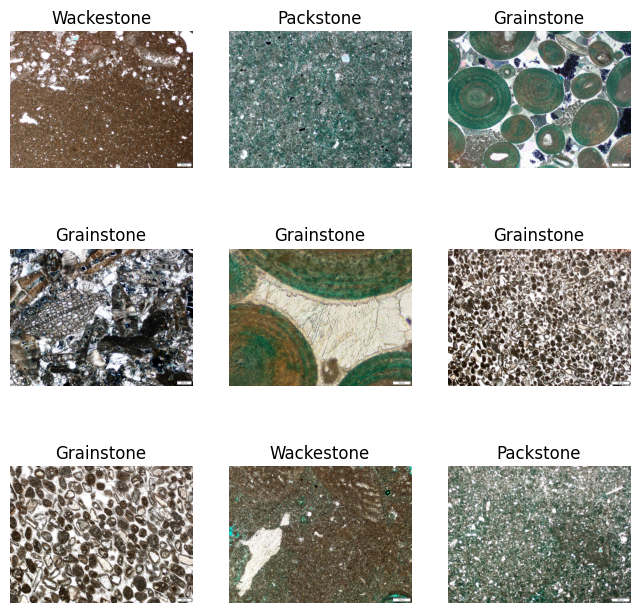

In [14]:
# plot dataset to see if image is loaded correctly
figure = plt.figure(figsize=(8, 8))
cols, rows = 3, 3

sample_idx = random.sample(range(0, len(dataset_hf['train'])), cols * rows)

for i in range(1, cols * rows + 1):
    img = dataset_hf['train'][sample_idx[i-1]]['image']
    label = id2label_hf[str(dataset_hf['train'][sample_idx[i-1]]['label'])]
    figure.add_subplot(rows, cols, i)
    plt.title(label)
    plt.axis("off")
    plt.imshow(img)
plt.show()

## Task-2 Fine tune the ViT model


### Data augmentation
The original samples already has the same image in multiple magnifications (x2, x4, and x10)and multiple polarization (parallel and cross), which is a form of data augmentation.  On top of that, simple transformation in the form of `RandomResizedCrop` is done.

The `RandomResizedCrop` will crop a random portion of image and resize it to a given size. A crop of the original image is made: the crop has a random area (H * W) and a random aspect ratio. This crop is finally resized to the given size.

Researchers may play around and find out better transformations for this case.

In [ ]:
# load image processor
checkpoint = "google/vit-base-patch16-224-in21k"
image_processor = AutoImageProcessor.from_pretrained(checkpoint)

# define normalization function to the image mean and image std
normalize = Normalize(mean=image_processor.image_mean, std=image_processor.image_std)

size = (
    image_processor.size["shortest_edge"]
    if "shortest_edge" in image_processor.size
    else (image_processor.size["height"], image_processor.size["width"])
)

# chain together multiple transforms by using compose
_transforms = Compose([RandomResizedCrop(size), ToTensor(), normalize])

# define transformation function
def transforms(examples):
    examples["pixel_values"] = [_transforms(img.convert("RGB")) for img in examples["image"]]
    del examples["image"]
    return examples

# apply transformation to the dataset
dataset_hf = dataset_hf.with_transform(transforms)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


### Define training parameters

In [ ]:
# define model
model = AutoModelForImageClassification.from_pretrained(
    checkpoint,
    num_labels=len(labels_hf),
    id2label=id2label_hf,
    label2id=label2id_hf,
)

# load accuracy metric from evaluate
accuracy = evaluate.load("accuracy")

# define compute metric
def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return accuracy.compute(predictions=predictions, references=labels)

# define training arguments
training_args = TrainingArguments(
    output_dir="model/vit-dunham-carbonate-classifier",
    remove_unused_columns=False,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    learning_rate=5e-5,                 # learning rate
    per_device_train_batch_size=8,     # training batch size
    gradient_accumulation_steps=2,
    per_device_eval_batch_size=8,
    num_train_epochs=20,
    warmup_ratio=0.1,
    logging_steps=1,
    load_best_model_at_end=True,        # model optimization via early stopping
    metric_for_best_model="accuracy",
    push_to_hub=False, # When set to True, this allows the trained model to be directly uploaded to the Hugging Face Model Hub.
)

# Instantiate the data collator
data_collator = DefaultDataCollator()

# Instantiate the trainer
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    train_dataset=dataset_hf["train"],
    eval_dataset=dataset_hf["test"],
    tokenizer=image_processor,
    compute_metrics=compute_metrics,
)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Train & evaluate

In [ ]:
# Train the model
trainer.train()

# Evaluate the model
eval_result = trainer.evaluate(eval_dataset = dataset_hf["test"])
print(eval_result)

# Save the formatted accuracy in a variable
accuracy = "{:.4f}".format(eval_result["eval_accuracy"])

Epoch,Training Loss,Validation Loss,Accuracy
1,1.576400,1.532907,0.444444
2,1.399100,1.425288,0.555556
3,1.279200,1.285073,0.777778
4,1.011900,1.162515,0.888889
5,0.991600,1.047071,0.888889
6,0.920200,0.983578,0.777778
7,0.699400,0.864909,0.888889
8,0.526000,0.711034,1.000000
9,0.538300,0.612692,1.000000
10,0.512800,0.533678,1.000000


{'eval_loss': 0.7675658464431763, 'eval_accuracy': 0.8888888888888888, 'eval_runtime': 0.5274, 'eval_samples_per_second': 17.064, 'eval_steps_per_second': 3.792, 'epoch': 20.0}


In [ ]:
print(accuracy)

0.8889


In [ ]:
!zip -r vit-dunham-carbonate-classifier.zip model/vit-dunham-carbonate-classifier/checkpoint-100

  adding: model/vit-dunham-carbonate-classifier/checkpoint-100/ (stored 0%)
  adding: model/vit-dunham-carbonate-classifier/checkpoint-100/trainer_state.json (deflated 86%)
  adding: model/vit-dunham-carbonate-classifier/checkpoint-100/optimizer.pt (deflated 8%)
  adding: model/vit-dunham-carbonate-classifier/checkpoint-100/scheduler.pt (deflated 50%)
  adding: model/vit-dunham-carbonate-classifier/checkpoint-100/preprocessor_config.json (deflated 47%)
  adding: model/vit-dunham-carbonate-classifier/checkpoint-100/training_args.bin (deflated 49%)
  adding: model/vit-dunham-carbonate-classifier/checkpoint-100/pytorch_model.bin (deflated 7%)
  adding: model/vit-dunham-carbonate-classifier/checkpoint-100/config.json (deflated 51%)
  adding: model/vit-dunham-carbonate-classifier/checkpoint-100/rng_state.pth (deflated 28%)


## Task-3 Model Inference

In [ ]:
# instantiate pipeline
pipe = pipeline(task='image-classification', model="/content/model/vit-dunham-carbonate-classifier/checkpoint-100", device = 0)

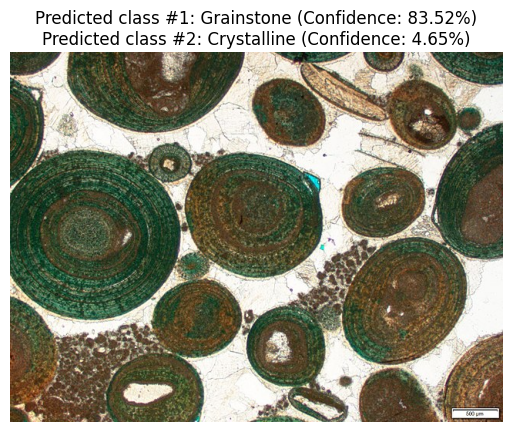

In [ ]:
#Write your code for inference here

# read image to be inferred
# source: https://en.wikipedia.org/wiki/Grainstone
infer_img = Image.open('wiki_grainstone.jpg')

# do the inference
proba = pipe(infer_img)

# get the top 2 class, since carbonate classification is usually not exact
pred_1 = proba[0]
pred_2 = proba[1]

# plot image
plt.title("Predicted class #1: {} (Confidence: {:.2%})\nPredicted class #2: {} (Confidence: {:.2%})".format(pred_1['label'], pred_1['score'], pred_2['label'], pred_2['score']))
plt.axis("off")
plt.imshow(infer_img)
plt.show()

## Task-4 Model Publishing

In [ ]:
#Write your code for publishing here

# login to huggingface
notebook_login()

In [ ]:
# push model to hub
trainer.push_to_hub()

training_args.bin:   0%|          | 0.00/4.09k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/343M [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

'https://huggingface.co/aviandito/vit-dunham-carbonate-classifier/tree/main/'

## Scoring on validation set: CarbonateWorld dataset by using Hugging Face-hosted model

In [15]:
# instantiate pipeline
pipe = pipeline(task='image-classification', model="aviandito/vit-dunham-carbonate-classifier", device = 0)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/881 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/343M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/325 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

Device set to use cuda:0


In [16]:
# load CarbonateWorld samples as validation dataset using huggingface imagefolder loader
!unzip "/carbonateworld.zip" -d "/content"

# Define the ClassLabel using the labels from the training dataset
# This ensures that the integer IDs for labels in dataset_val will match dataset_hf
dunham_class_label = ClassLabel(names=labels_hf)

# Define the features for the validation dataset
validation_features = Features({
    'image': Image(), # Use Image() directly after importing it
    'label': dunham_class_label
})

# Load the validation dataset with the explicitly defined features
dataset_val = load_dataset("imagefolder", data_dir='carbonateworld', split = 'validation', features=validation_features)

Archive:  /carbonateworld.zip
   creating: /content/carbonateworld/
   creating: /content/carbonateworld/validation/
   creating: /content/carbonateworld/validation/Mudstone/
  inflating: /content/carbonateworld/validation/Mudstone/1.1.1.2.jpg  
  inflating: /content/carbonateworld/validation/Mudstone/1.1.1.1.jpg  
   creating: /content/carbonateworld/validation/Packstone/
  inflating: /content/carbonateworld/validation/Packstone/1.1.3.7.jpg  
  inflating: /content/carbonateworld/validation/Packstone/1.1.3.6.jpg  
  inflating: /content/carbonateworld/validation/Packstone/1.1.3.4.jpg  
  inflating: /content/carbonateworld/validation/Packstone/1.1.3.5.jpg  
  inflating: /content/carbonateworld/validation/Packstone/1.1.3.1.jpg  
  inflating: /content/carbonateworld/validation/Packstone/1.1.3.2.jpg  
  inflating: /content/carbonateworld/validation/Packstone/1.1.3.3.jpg  
   creating: /content/carbonateworld/validation/Crystalline/
   creating: /content/carbonateworld/validation/Wackestone/

Resolving data files:   0%|          | 0/28 [00:00<?, ?it/s]

Generating validation split: 0 examples [00:00, ? examples/s]

In [17]:
# plot images
directory_path = "/content/carbonateworld"
images_to_plot = []

for root, _, files in os.walk(directory_path):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
            file_path = os.path.join(root, file)
            # The label is the immediate parent directory name
            label = os.path.basename(root)
            images_to_plot.append((file_path, label))

num_images = len(images_to_plot)
if num_images == 0:
    print(f"No images found in {directory_path}.")
else:
    cols = 4  # Adjusted for A4 aspect ratio
    rows = (num_images + cols - 1) // cols

    figure = plt.figure(figsize=(cols * 2.5, rows * 2.5)) # Reduced multiplier for better fit

    for i, (img_path, label) in enumerate(images_to_plot):
        try:
            img = PillowImage.open(img_path)
            figure.add_subplot(rows, cols, i + 1)
            plt.title(label)
            plt.axis("off")
            plt.imshow(img)
        except Exception as e:
            print(f"Could not load image {img_path}: {e}")
            continue
    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

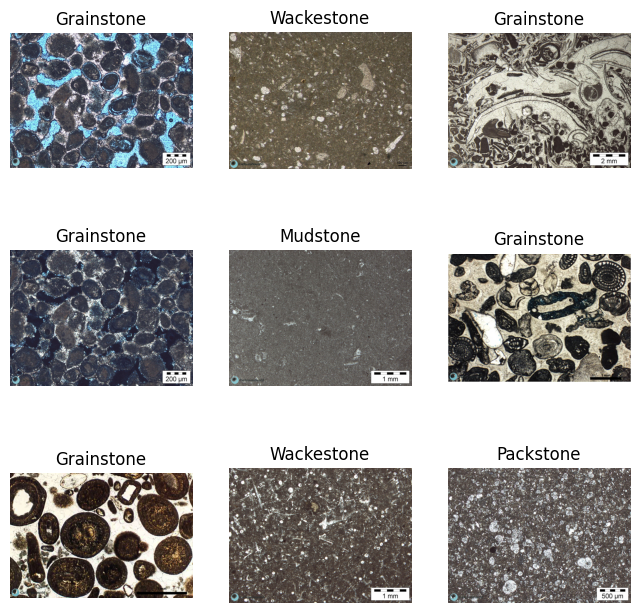

In [18]:
# plot dataset to see if image is loaded correctly
figure = plt.figure(figsize=(8, 8))
cols, rows = 3, 3

sample_idx = random.sample(range(0, len(dataset_val)), cols * rows)

for i in range(1, cols * rows + 1):
    img = dataset_val[sample_idx[i-1]]['image']
    label = id2label_hf[str(dataset_val[sample_idx[i-1]]['label'])]
    figure.add_subplot(rows, cols, i)
    plt.title(label)
    plt.axis("off")
    plt.imshow(img)
plt.show()

### Inference on the validation dataset

In [27]:
# Setup and Inference (Run once)
accuracy_metric = evaluate.load("accuracy")
all_results = []
label_ids = list(map(int, label2id_hf.values()))

# Define a simple collate function for the DataLoader
# The pipeline expects an image directly or a list of images
def collate_fn(batch):
    # The batch here is a list of dictionaries, where each dict has 'image' and 'label'
    # Convert PyTorch tensors back to PIL Images
    images = [PillowImage.fromarray(item['image'].permute(1, 2, 0).numpy()) for item in batch]
    labels = [item['label'] for item in batch]
    return {'images': images, 'labels': labels}

# Create a DataLoader for batch processing
dataset_val.set_format(type="torch", columns=["image", "label"])
validation_dataloader = DataLoader(dataset_val, batch_size=8, collate_fn=collate_fn)

for batch in tqdm(validation_dataloader, desc="Inference"):
    images = batch['images']
    true_ids = batch['labels']

    # Do batch inference
    predictions_batch = pipe(images)

    # Process predictions for each image in the batch
    for i, image in enumerate(images):
        true_id = true_ids[i]
        preds_for_image = predictions_batch[i] # This will be a list of dicts for one image

        pred_id = int(label2id_hf[preds_for_image[0]['label']])

        all_results.append({
            "image": image, # Store PIL Image directly
            "true_id": true_id.item() if isinstance(true_id, torch.Tensor) else true_id,
            "pred_id": pred_id,
            "full_preds": preds_for_image # Contains labels and scores
        })

# Extract lists for metrics
true_labels = [res['true_id'] for res in all_results]
pred_labels = [res['pred_id'] for res in all_results]

Inference:   0%|          | 0/4 [00:00<?, ?it/s]

### Plot accuracy & confusion matrix

Evaluation results: {'accuracy': 0.6785714285714286}


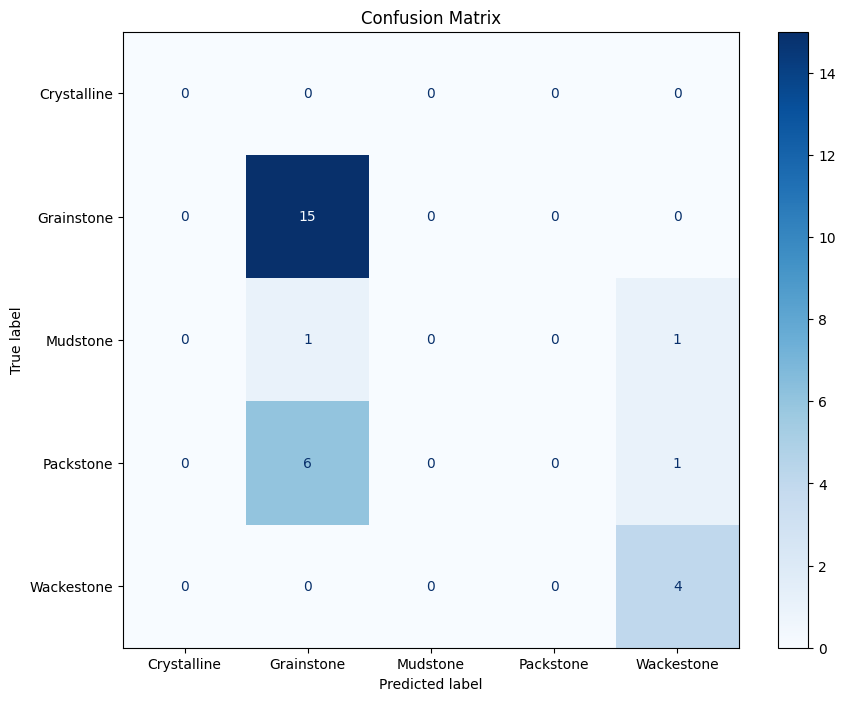

In [28]:
# Accuracy & Confusion Matrix
results = accuracy_metric.compute(predictions=pred_labels, references=true_labels)
print(f"Evaluation results: {results}")

cm = confusion_matrix(true_labels, pred_labels, labels=label_ids)
fig, ax = plt.subplots(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels_hf)
disp.plot(cmap=plt.cm.Blues, ax=ax)
plt.title("Confusion Matrix")
plt.show()

### Plot packstones misclassified as grainstones

In [29]:
# Misclassification Visualization (Packstone vs Grainstone)
p_id, g_id = int(label2id_hf['Packstone']), int(label2id_hf['Grainstone'])
misclassified = [res for res in all_results if res['true_id'] == p_id and res['pred_id'] == g_id]

if not misclassified:
    print("No Packstone misclassified as Grainstone.")
else:
    cols = 3
    rows = (len(misclassified) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = axes.flatten()

    for i, res in enumerate(misclassified):
        ax = axes[i]
        top2 = res['full_preds'][:2]
        title = f"({chr(97+i)}) True: Packstone\nPred #1: {top2[0]['label']} ({top2[0]['score']:.2%})"
        if len(top2) > 1:
            title += f"\nPred #2: {top2[1]['label']} ({top2[1]['score']:.2%})"

        ax.imshow(res['image'])
        ax.set_title(title)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Calculate top-2 Accuracy and full classification report

In [30]:
# Top-2 Accuracy & Report
top2_correct = 0
for res in all_results:
    top2_ids = [int(label2id_hf[p['label']]) for p in res['full_preds'][:2]]
    if res['true_id'] in top2_ids:
        top2_correct += 1

print(f"Top 2 Accuracy: {top2_correct / len(all_results):.4f}")

# Classification report
unique_labels = sorted(np.unique(true_labels))
target_names = [id2label_hf[str(l)] for l in unique_labels]
report = classification_report(true_labels, pred_labels, labels=unique_labels,
                               target_names=target_names, output_dict=True, zero_division=0)
print("\nClassification Report:")
pd.DataFrame(report).transpose()

Top 2 Accuracy: 0.8571

Classification Report:


,precision,recall,f1-score,support
Grainstone,0.681818,1.000000,0.810811,15.000000
Mudstone,0.000000,0.000000,0.000000,2.000000
Packstone,0.000000,0.000000,0.000000,7.000000
Wackestone,0.666667,1.000000,0.800000,4.000000
accuracy,0.678571,0.678571,0.678571,0.678571
macro avg,0.337121,0.500000,0.402703,28.000000
weighted avg,0.460498,0.678571,0.548649,28.000000


In [31]:
summary_data = []

for i, res in enumerate(all_results):
    # Extract top 2 predictions from the stored 'full_preds'
    top_1 = res['full_preds'][0]
    top_2 = res['full_preds'][1] if len(res['full_preds']) > 1 else {"label": "N/A", "score": 0.0}

    summary_data.append({
        "Sample #": i,
        "True Label": id2label_hf[str(res['true_id'])],
        "Top 1 Predicted": top_1['label'],
        "Top 1 Confidence": f"{top_1['score']:.2%}",
        "Top 2 Predicted": top_2['label'],
        "Top 2 Confidence": f"{top_2['score']:.2%}",
        "Is Top 1 Correct": 1 if res['true_id'] == int(label2id_hf[top_1['label']]) else 0,
        "Is Top 2 Correct": 1 if res['true_id'] in [int(label2id_hf[top_1['label']]), int(label2id_hf[top_2['label']])] else 0
    })

# Convert to DataFrame for easy viewing
df_predictions = pd.DataFrame(summary_data)

df_predictions

,Sample #,True Label,Top 1 Predicted,Top 1 Confidence,Top 2 Predicted,Top 2 Confidence,Is Top 1 Correct,Is Top 2 Correct
0,0,Grainstone,Grainstone,41.53%,Packstone,16.25%,1,1
1,1,Grainstone,Grainstone,50.85%,Crystalline,14.19%,1,1
2,2,Grainstone,Grainstone,55.56%,Crystalline,13.38%,1,1
3,3,Grainstone,Grainstone,53.77%,Packstone,13.20%,1,1
4,4,Grainstone,Grainstone,42.14%,Crystalline,17.88%,1,1
5,5,Grainstone,Grainstone,39.20%,Packstone,22.31%,1,1
6,6,Grainstone,Grainstone,35.96%,Packstone,20.49%,1,1
7,7,Grainstone,Grainstone,62.31%,Packstone,11.23%,1,1
8,8,Grainstone,Grainstone,55.72%,Packstone,12.64%,1,1
9,9,Grainstone,Grainstone,56.36%,Packstone,12.17%,1,1


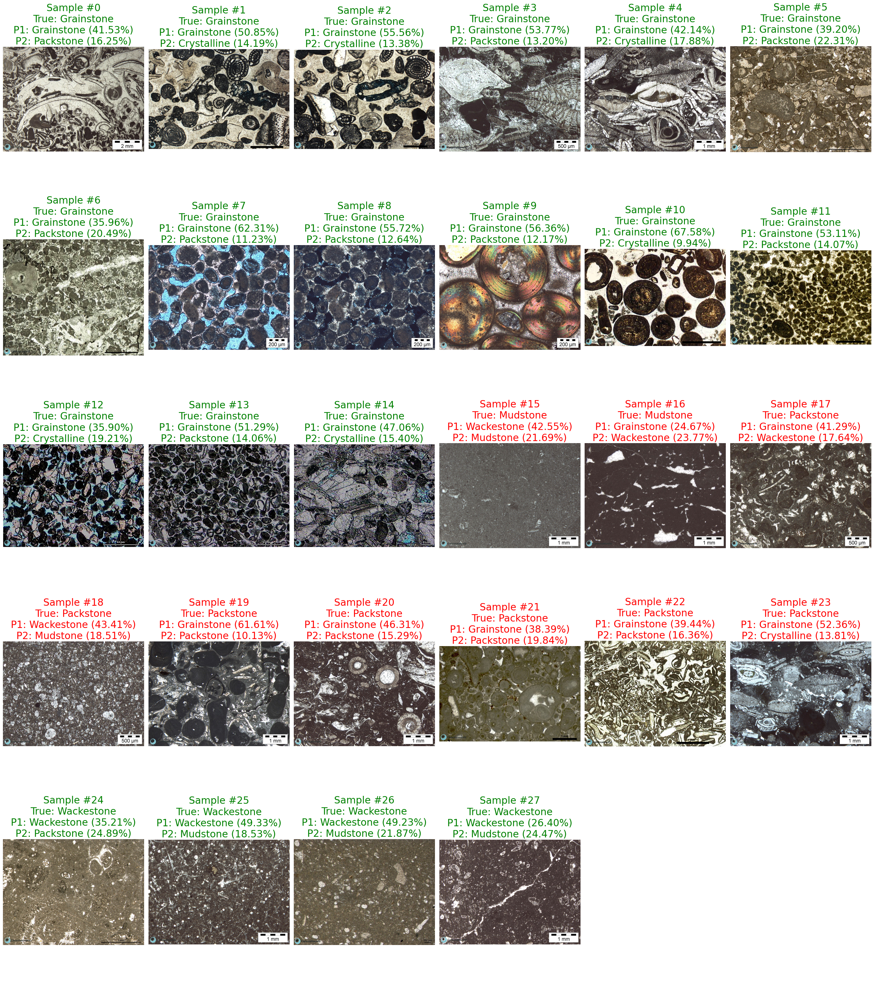

In [36]:
# Select how many samples you want to plot
num_to_plot = 28
cols = 6
rows = (num_to_plot + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 7))
axes = axes.flatten()

for i in range(num_to_plot):
    ax = axes[i]
    res = all_results[i]
    table_info = summary_data[i]

    # Display the image
    ax.imshow(res['image'])

    # Create title using the sample number and table details
    title = (f"Sample #{table_info['Sample #']}\n"
             f"True: {table_info['True Label']}\n"
             f"P1: {table_info['Top 1 Predicted']} ({table_info['Top 1 Confidence']})\n"
             f"P2: {table_info['Top 2 Predicted']} ({table_info['Top 2 Confidence']})")

    # Color the title green if correct, red if incorrect
    is_correct = table_info['True Label'] == table_info['Top 1 Predicted']
    ax.set_title(title, color="green" if is_correct else "red", fontsize=24)
    ax.axis("off")

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()